# Water Potability Data Analyzes

## Goal of the project

The goal of this project is to predict the potability of water. Therefore, we are trying to solve a binary classification problem. This knowledge will be used to determine if an investment in a potable network is useful. The water must be drunk by humans afterwards. Knowing that drinking non-potable water can lead to health problems, it is important to find the samples where the water is not potable. Thus, we'll try to have a high recall. Also, a water network is costly and we'll want to be confident about the usefulness of a network. Thus, we are trying to have a high precision too.

## Packages management

In [4]:
# Packages installations
!pip install numpy
!pip install pandas
!pip install seaborn
!pip install dataprep
!pip install missingno

You should consider upgrading via the '/Users/clotilde/.pyenv/versions/3.8.6/envs/projet-appr-auto/bin/python3.8 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/clotilde/.pyenv/versions/3.8.6/envs/projet-appr-auto/bin/python3.8 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/clotilde/.pyenv/versions/3.8.6/envs/projet-appr-auto/bin/python3.8 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/clotilde/.pyenv/versions/3.8.6/envs/projet-appr-auto/bin/python3.8 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/clotilde/.pyenv/versions/3.8.6/envs/projet-appr-auto/bin/python3.8 -m pip install --upgrade pip' command.


In [15]:
# Packages importations
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dataprep.eda import *
import missingno as msno
import seaborn as sns
import warnings
from configparser import ConfigParser
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, KernelPCA
import plotly.express as ex

warnings.filterwarnings("ignore") # Use to clean the output of dataprep.eda

## Load Dataset

In [6]:
config = ConfigParser()
config.read("config.ini")
DATA_FOLDER = config["DATA"]["DATA_FOLDER"]
TRAIN_TEST_SEED = int(config["SEEDS"]["TEST_SEED"])
TEST_SIZE = float(config["DATA"]["TEST_SIZE"])
SHUFFLE_SEED = int(config["SEEDS"]["SHUFFLE_SEED"])

df = pd.read_csv(DATA_FOLDER)

df.sample(frac=1, random_state=SHUFFLE_SEED).reset_index(drop=True)

dataset, _ = train_test_split(df, test_size=TEST_SIZE, random_state=TRAIN_TEST_SEED)

In [7]:
dataset.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
864,7.762021,173.636742,15548.416670,5.018671,330.390976,520.640774,11.147704,87.481505,3.256301,0
759,8.390501,215.295518,27032.142260,6.553958,282.859453,443.445590,12.841611,46.368219,4.150359,1
2365,6.407963,199.131726,28460.203400,4.613721,330.914076,448.858006,11.656913,70.161839,2.954093,1
1110,4.736405,203.276420,28698.729960,5.271367,323.683683,508.820341,14.063140,65.155182,4.995602,1
1359,7.937392,170.445328,6626.376426,5.117364,372.625257,316.022466,23.135952,73.786211,4.270851,0


In this dataset we have 9 features and one target wich is the potability represented by the values 0 for non-potable and 1 for potable

## Dataset exploration

We decided to use the package dataprep.eda wich allows us to perform all the classical analyses that we must for an exploration of the dataset and to display them with an usser friendly interface.

  0%|          | 0/1755 [00:00<?, ?it/s]

DataPrep Report
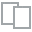
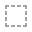
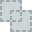
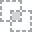
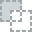
...
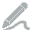
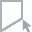
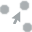
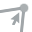
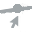

In [8]:
# Use dataprep to generate a report with the standart analyzes (missing values, classe repartition, correlation...)
create_report(dataset)

We can see several things here :
- There are missing values for PH, Sulfate and Trihalomethanes => it means that we will we have to handle it by choosing a method based on MCAR, MAR or MNAR
- There are some outliers but they seems to correponds to extreme cases rather than mesurement error so we don't need to remove them, we must instead choose a method to handle them.
- Features does not seem to be correlated to each other
- There are no duplicates
- The 0-1 classe is relatively equally represented (60%/40%)

Here we plot the pairwise relationships in a datset. It doesn't give much information :

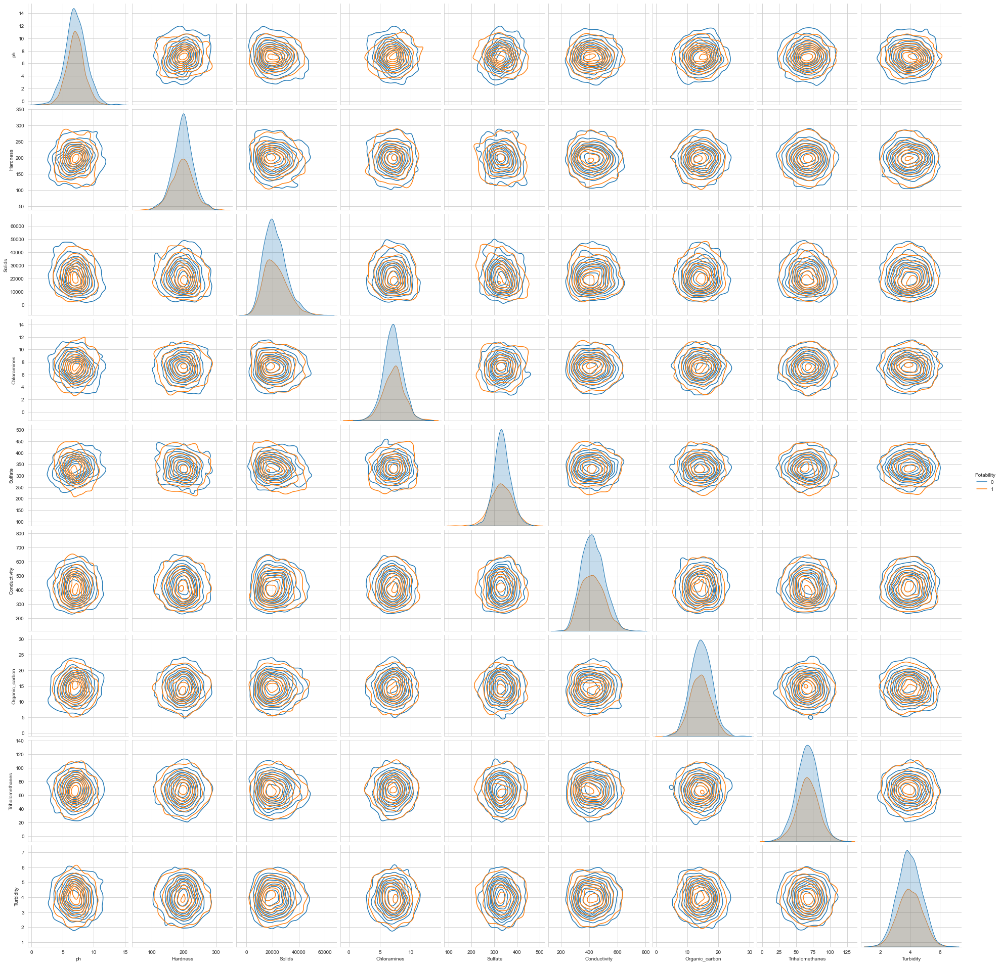

In [9]:
sns.set_style("whitegrid")
sns.pairplot(dataset, hue='Potability', height=3, kind="kde")
plt.show()

## In Depth analyzes

We can analyze more the missing values to determine which techniques to use

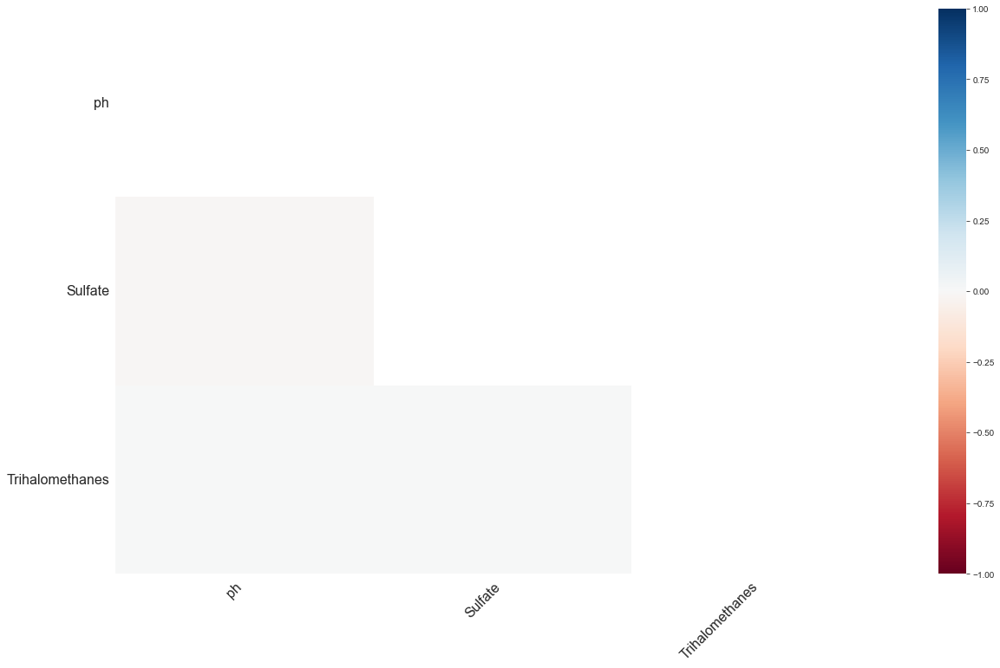

In [10]:
msno.heatmap(dataset); # correlation heatmap that measures nullity correlation ie. how strongly the presence or absence of one variable affects the presence of another:

Wee see that there is no correlation between the misssing values, we are in the case of MCAR. We can try to remove all rows with Nan values (listwise deletion) and see if it change the characteristics of the dataset

  0%|          | 0/1765 [00:00<?, ?it/s]

DataPrep Report
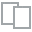
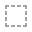
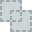
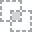
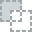
...
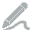
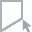
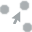
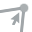
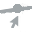

In [11]:
dataset_without_NaN = dataset.dropna()
create_report(dataset_without_NaN)

We can see that removing the NaN values doesn't change the characteristic of the dataset (distribution of features (mean, standard deviation... ), distribution of 0/1 classe...). It means that, if we want, we can choose to use the listwise deletion methods to handle the Nan values. Nevertheless we decided to test in our pipeline different ways to handle the Nan values : listwise deletion, simple imputer (mean), iterative imput, knn iput. We will do a grid search will all this methods to determine wich one as the best results. We also see that the sulfates columns has a lot of missing values (24%), but it's not a good idea to remove this column because as the features are not correlated we will loose a lot of information here.

Then we look in depth about the outliers:

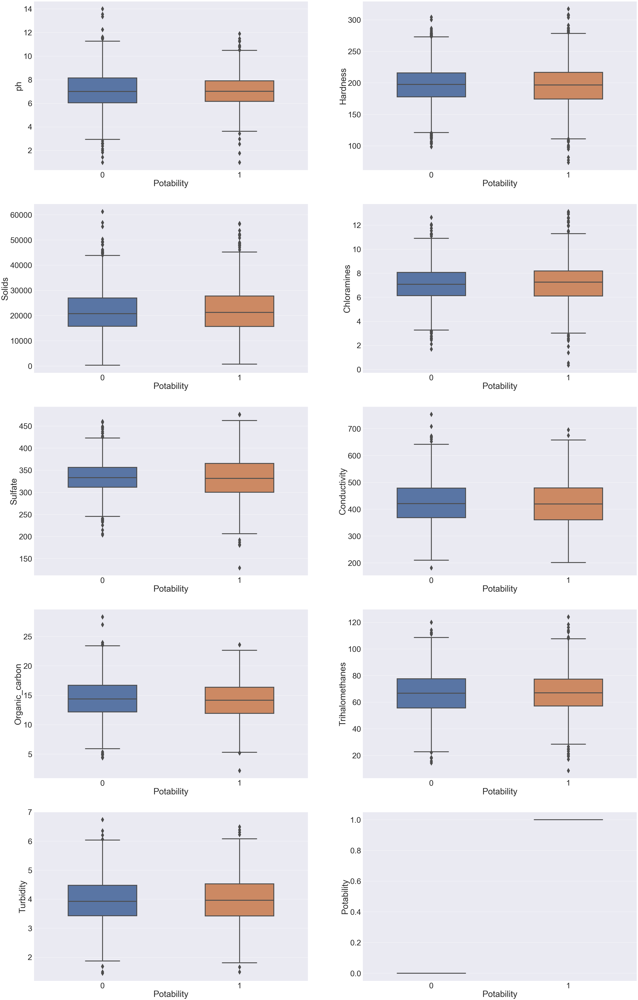

In [12]:
# Finding outliers
sns.set(font_scale=4)

fig, axes = plt.subplots(5, 2, figsize=(60, 100))
for i, column_name in enumerate(dataset.columns):
    sns.boxplot(
        x="Potability", 
        y=column_name, 
        data=dataset, 
        ax=axes[i//2, i%2], 
        linewidth=5, 
        width=0.5,
        fliersize=20)

plt.show()

We can see that there are several outliers for each features. We don't think that those outliers correspond to error because we can see that for the pH, for example, the values are between 0 and 14 which are the correct values of pH. However, for a potable water it's weird to have a pH below 4. We will remove the extreme outliers by using the IQR methods, in order to keep only the value that are conceivables.

## PCA

We can try to diminish the dimension of the dataset to see if it is possible de decrease the number of feature without loosing too much information.
We'll see if a linear combination of parameters better explains our problem.

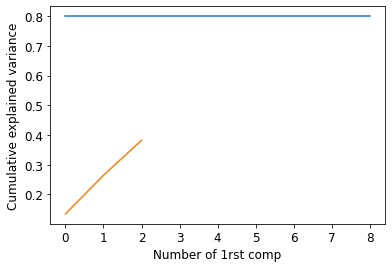

In [ ]:
NB_FEATURES = int(input()) # Number of features kept

pca_pipe= Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(NB_FEATURES))
])

pca_res = pca_pipe.fit_transform(X, y)
explained_ratio = pca_pipe['pca'].explained_variance_ratio_
explained_ratio_cum = [sum([explained_ratio[j] for j in range(i + 1)]) for i in range(len(explained_ratio))]
threshold = [0.8 for i in range(9)]
fig, axes = plt.subplots(1,1)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
axes.xaxis.set_ticks([i for i in range(9)])
axes.set_ylabel("Cumulative explained variance", fontsize=12)
axes.set_xlabel("Number of 1rst comp", fontsize=12)
plt.plot(threshold)
plt.plot(explained_ratio_cum)
plt.show()


The data is not linearly separable since a high number of principal vectors are needed to get an accetable explained variance. 

In [ ]:
fig = ex.scatter_matrix(
    pca_res,
    labels={f"{i}": f"PC {i+1} ({round(variance * 100, 1)}%)" for i, variance in enumerate(explained_ratio)},
    dimensions=range(NB_FEATURES),
    color=dataset_nan.iloc[:, -1].map({0:'Not Potabale',1:'Potable'}),
)
fig.update_traces(diagonal_visible=False)
fig.update_layout(title="Combinations of principal components over dataset")
